In [3]:
import pandas as pd 
import numpy as np
import math
import seaborn as sns 
import matplotlib.pyplot as plt

In [4]:
df = pd.read_csv('Datasets/weatherAus.csv')
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


In [5]:
df.shape

(145460, 23)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   Location       145460 non-null  object 
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  object 
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  object 
 10  WindDir3pm     141232 non-null  object 
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null

In [7]:
df=df.drop('Date', axis=1)

In [8]:
df.isnull().sum()

Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

In [9]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,143975.000000,144199.000000,142199.000000,82670.000000,75625.000000,135197.000000,143693.000000,142398.000000,142806.000000,140953.000000,130395.00000,130432.000000,89572.000000,86102.000000,143693.000000,141851.00000
mean,12.194034,23.221348,2.360918,5.468232,7.611178,40.035230,14.043426,18.662657,68.880831,51.539116,1017.64994,1015.255889,4.447461,4.509930,16.990631,21.68339
std,6.398495,7.119049,8.478060,4.193704,3.785483,13.607062,8.915375,8.809800,19.029164,20.795902,7.10653,7.037414,2.887159,2.720357,6.488753,6.93665
min,-8.500000,-4.800000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.50000,977.100000,0.000000,0.000000,-7.200000,-5.40000
25%,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.90000,1010.400000,1.000000,2.000000,12.300000,16.60000
50%,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.60000,1015.200000,5.000000,5.000000,16.700000,21.10000
75%,16.900000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.40000,1020.000000,7.000000,7.000000,21.600000,26.40000
max,33.900000,48.100000,371.000000,145.000000,14.500000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.00000,1039.600000,9.000000,9.000000,40.200000,46.70000


In [10]:
df.dtypes

Location          object
MinTemp          float64
MaxTemp          float64
Rainfall         float64
Evaporation      float64
Sunshine         float64
WindGustDir       object
WindGustSpeed    float64
WindDir9am        object
WindDir3pm        object
WindSpeed9am     float64
WindSpeed3pm     float64
Humidity9am      float64
Humidity3pm      float64
Pressure9am      float64
Pressure3pm      float64
Cloud9am         float64
Cloud3pm         float64
Temp9am          float64
Temp3pm          float64
RainToday         object
RainTomorrow      object
dtype: object

## **Treating Null Values**

In [11]:
for col in df.columns:
    if df[col].dtype == 'object':
        mode_value = df[col].mode()[0]
        df[col].fillna(mode_value, inplace=True)
    else:
        mean_value = df[col].mean()
        df[col].fillna(mean_value, inplace=True)

df.head()

C:\Users\Rutik\AppData\Local\Temp\ipykernel_15216\2850645747.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna(mode_value, inplace=True)
C:\Users\Rutik\AppData\Local\Temp\ipykernel_15216\2850645747.py:7: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, wh

,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,Albury,13.4,22.9,0.6,5.468232,7.611178,W,44.0,W,WNW,...,71.0,22.0,1007.7,1007.1,8.000000,4.50993,16.9,21.8,No,No
1,Albury,7.4,25.1,0.0,5.468232,7.611178,WNW,44.0,NNW,WSW,...,44.0,25.0,1010.6,1007.8,4.447461,4.50993,17.2,24.3,No,No
2,Albury,12.9,25.7,0.0,5.468232,7.611178,WSW,46.0,W,WSW,...,38.0,30.0,1007.6,1008.7,4.447461,2.00000,21.0,23.2,No,No
3,Albury,9.2,28.0,0.0,5.468232,7.611178,NE,24.0,SE,E,...,45.0,16.0,1017.6,1012.8,4.447461,4.50993,18.1,26.5,No,No
4,Albury,17.5,32.3,1.0,5.468232,7.611178,W,41.0,ENE,NW,...,82.0,33.0,1010.8,1006.0,7.000000,8.00000,17.8,29.7,No,No


In [12]:
df.isnull().sum()

Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

## **Data Visualization**

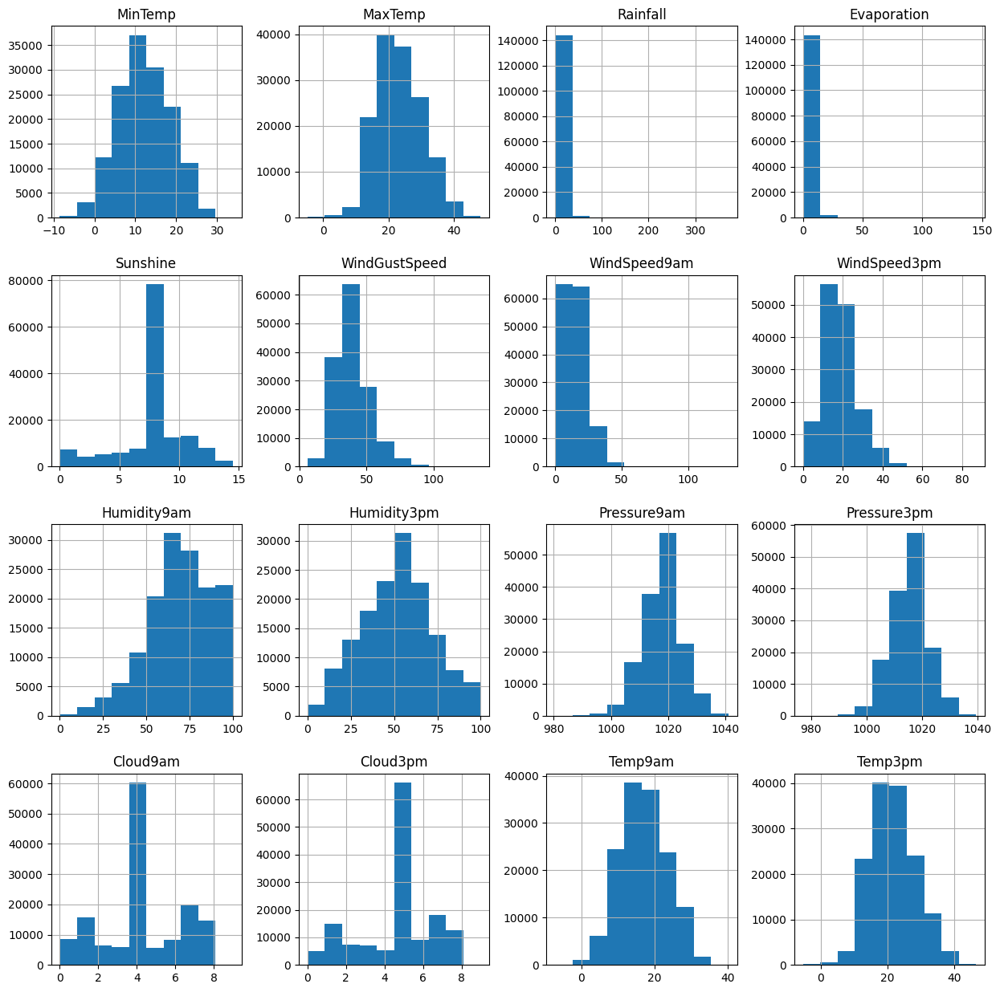

In [13]:
numerical_cols = [col for col in df.columns if df[col].dtype != 'object']
df[numerical_cols].hist(figsize=(15, 15))
plt.subplots_adjust(bottom=0.1)
plt.show()


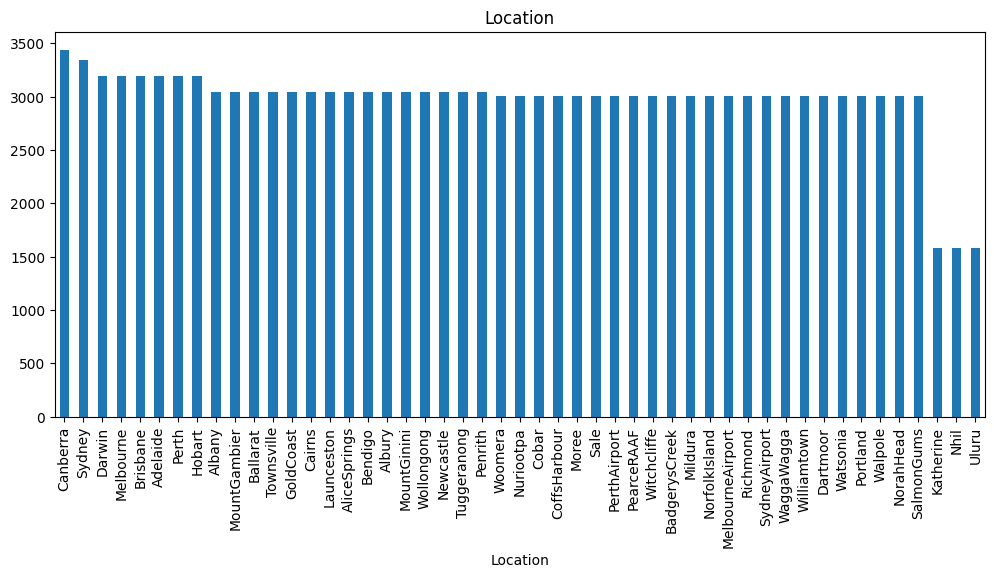

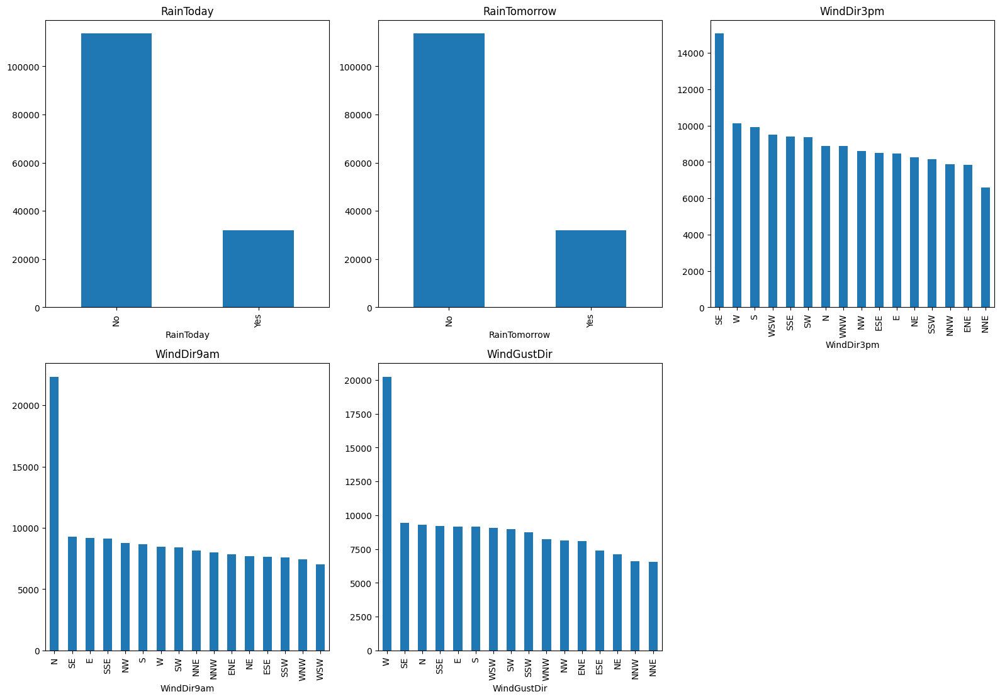

In [14]:
plt.figure(figsize=(12, 5))
df['Location'].value_counts().plot(kind='bar')
plt.title('Location')
plt.show()

categorical_cols = df.select_dtypes(include=['object']).columns.difference(['Date', 'Location'])
plt.figure(figsize=(16, 16))
for i, column in enumerate(categorical_cols, 1):
    plt.subplot(3, 3, i) 
    df[column].value_counts().plot(kind='bar')
    plt.title(column)
plt.tight_layout()
plt.show()

C:\Users\Rutik\AppData\Local\Temp\ipykernel_15216\1698079697.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])
C:\Users\Rutik\AppData\Local\Temp\ipykernel_15216\1698079697.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(x=df[column])
C:\Users\Rutik\AppData\Local\Temp\ipykerne

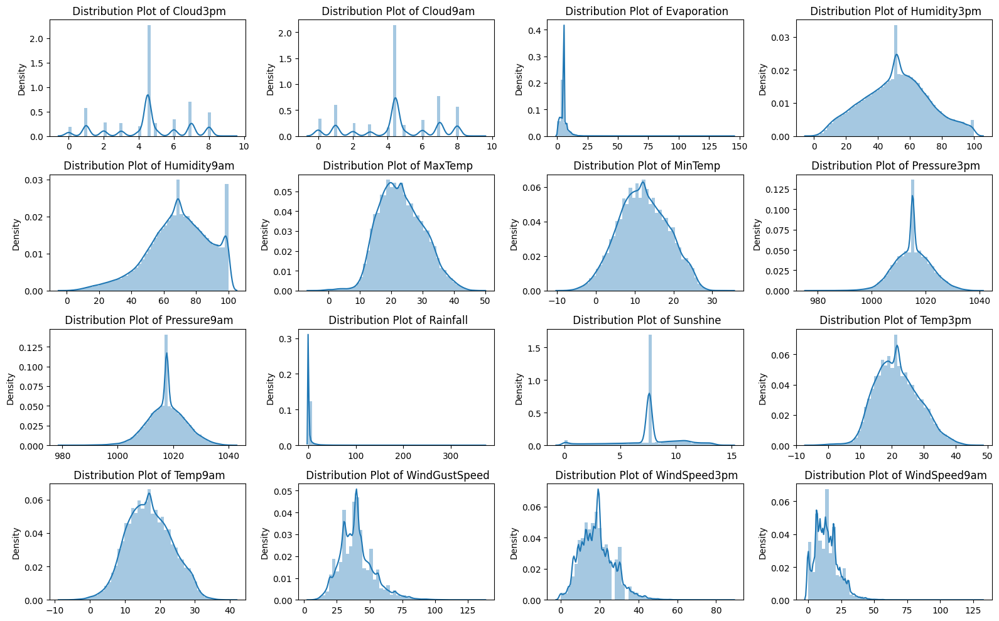

In [15]:
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns.difference(['RainToday', 'RainTomorrow'])
plt.figure(figsize=(16, 10))
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(4, 4, i)
    sns.distplot(x=df[column])
    plt.title(f' Distribution Plot of {column}')
plt.tight_layout()
plt.show()

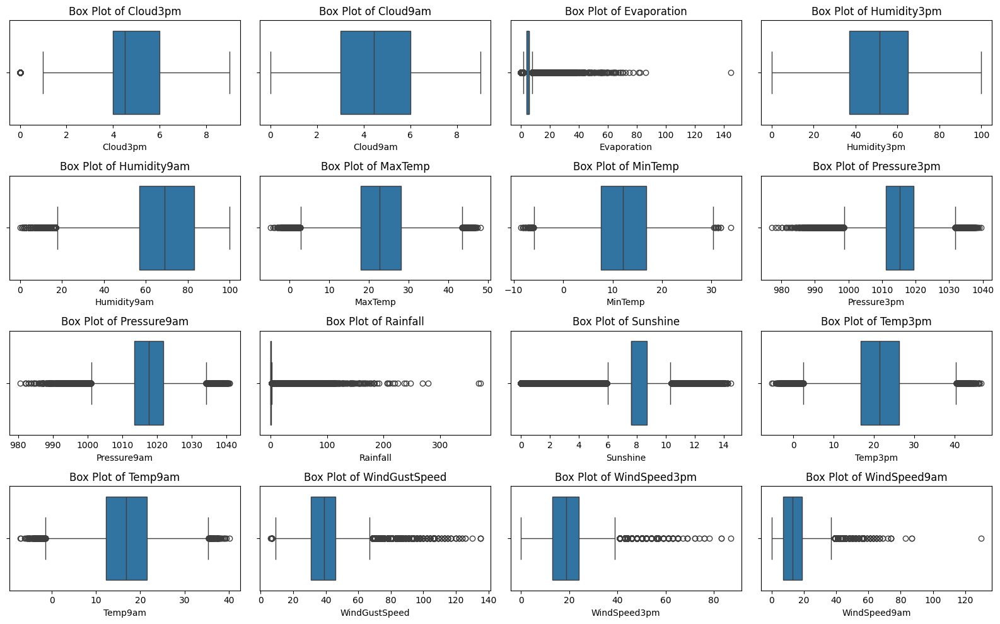

In [16]:
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns.difference(['RainToday', 'RainTomorrow'])
plt.figure(figsize=(16, 10))
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(x=df[column])
    plt.title(f'Box Plot of {column}')

plt.tight_layout()
plt.show()

## **Creating Dummy Variables and Transforming in Numerical Values for Categorical Variables**

In [17]:
from sklearn import preprocessing
labelencoder = preprocessing.LabelEncoder()

df['Location'] = labelencoder.fit_transform(df['Location'])
df['WindGustDir'] = labelencoder.fit_transform(df['WindGustDir'])
df['WindDir9am'] = labelencoder.fit_transform(df['WindDir9am'])
df['WindDir3pm'] = labelencoder.fit_transform(df['WindDir3pm'])
df = pd.get_dummies(df,columns = ["RainToday","RainTomorrow"],drop_first = True) 

## **Correction Matrix**

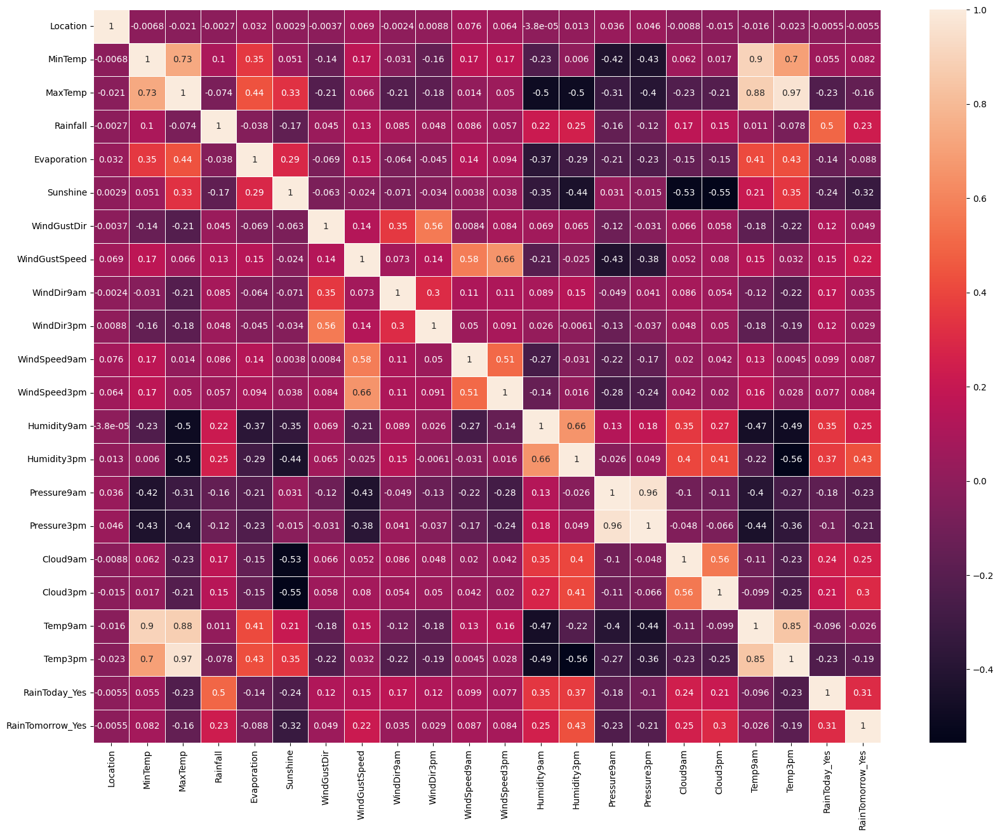

In [18]:
corr_matrix = df.corr()

# Create a heatmap
plt.figure(figsize=(20, 15))
sns.heatmap(corr_matrix, annot=True, linewidths=0.5)
plt.show()

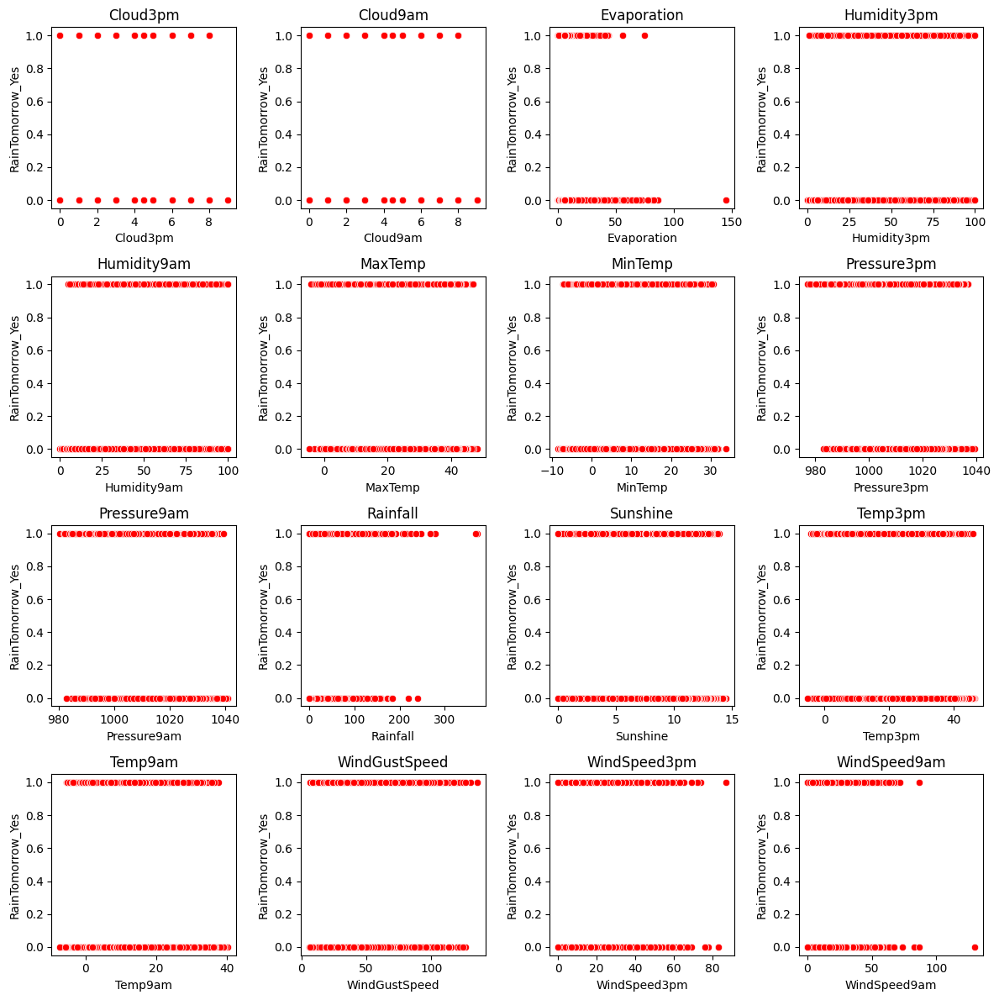

In [19]:
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns.difference(['RainToday_Yes', 'Date', 'Location', 'Date_month', 'Date_day', 'Date_year'])

num_columns = len(numerical_columns)
cols = 4
rows = math.ceil(num_columns / cols)
plt.figure(figsize=(12, 12))
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(rows, cols, i)
    sns.scatterplot(x=column, y='RainTomorrow_Yes', data=df, color='red')
    plt.title(column)

plt.tight_layout()
plt.show()


## **Data Outlier Treatment**

In [20]:
#function to handle outliers using Interquartile range
def outliers_iqr(df, feature):
    q1 = df[feature].quantile(0.25)
    q3 = df[feature].quantile(0.75)
    iqr = q3 -q1
    lower_threshold = q1 - (1.5 * iqr)
    upper_threshold = q3 + (1.5 * iqr)
    
    df.loc[df[feature] <= lower_threshold, feature] = lower_threshold
    df.loc[df[feature] >= upper_threshold, feature] = upper_threshold
    
    return df

for column in numerical_columns:
    df = outliers_iqr(df, column)

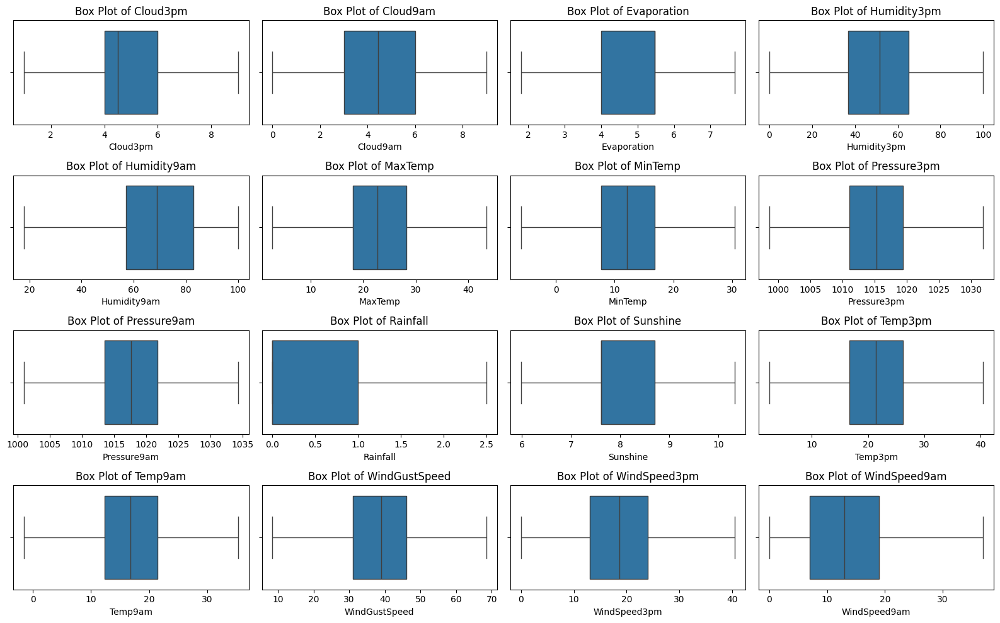

In [21]:
numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns.difference(['RainToday_Yes', 'Date', 'Location', 'Date_month', 'Date_day', 'Date_year'])
plt.figure(figsize=(16, 10))
for i, column in enumerate(numerical_columns, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(x=df[column])
    plt.title(f'Box Plot of {column}')

plt.tight_layout()
plt.show()

## **Splitting Data into Train and Test**

In [22]:
X = df.drop(["RainTomorrow_Yes"],axis=1)
Y = df['RainTomorrow_Yes']

In [23]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.2, random_state=69)

In [24]:
print("x_train shape:", X_train.shape)
print("x_test shape:", X_test.shape)
print("y_train shape:", y_train.shape)
print("y_test shape:", y_test.shape)

x_train shape: (116368, 21)
x_test shape: (29092, 21)
y_train shape: (116368,)
y_test shape: (29092,)


## **Model Training**

### **Model 01 - Decision Tree Classifier**

In [25]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, roc_auc_score, precision_score, recall_score,classification_report
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import confusion_matrix

In [26]:
# Decision Tree Classifier
dtc_tree = DecisionTreeClassifier(max_depth=3)
dtc_tree.fit(X_train, y_train)


DecisionTreeClassifier(max_depth=3)

In [27]:
# Predict Values
y_train_pred = dtc_tree.predict(X_train)
y_test_pred = dtc_tree.predict(X_test)

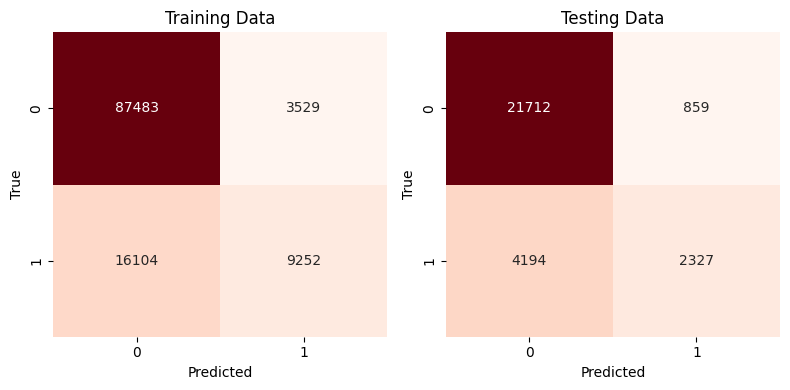

In [28]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4))

# Confusion Matrix for Training Data
cm_train = confusion_matrix(y_train, y_train_pred)
sns.heatmap(cm_train, ax=axes[0], annot=True, fmt='d', cmap='Reds', cbar=False)
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('True')
axes[0].set_title('Training Data')

# Confusion Matrix for Testing Data
cm_test = confusion_matrix(y_test, y_test_pred)
sns.heatmap(cm_test, ax=axes[1], annot=True, fmt='d', cmap='Reds', cbar=False)
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('True')
axes[1].set_title('Testing Data')

plt.tight_layout()
plt.show()


In [29]:
# Accuracy
DTC_accuracy_score=accuracy_score(y_test, y_test_pred)
print("Accuracy (Test) of Decision Tree Classifier:",DTC_accuracy_score,"\n")

# Precision
DTC_precision_score=precision_score(y_test, y_test_pred)
print("Precision (Test) of Decision Tree Classifier:", DTC_precision_score,"\n")

# Recall
DTC_recall_score=recall_score(y_test, y_test_pred)
print("Recall (Test) of Decision Tree Classifier:",DTC_recall_score ,"\n")

# ROC AUC Score
DTC_roc_auc_score= roc_auc_score(y_test, y_test_pred)
print("ROC AUC Score (Test) of Decision Tree Classifier:", DTC_roc_auc_score)

Accuracy (Test) of Decision Tree Classifier: 0.8263096383885604 

Precision (Test) of Decision Tree Classifier: 0.7303829252981795 

Recall (Test) of Decision Tree Classifier: 0.35684710933905844 

ROC AUC Score (Test) of Decision Tree Classifier: 0.6593947123497382


Text(0.5, 1.0, 'Receiver Operating Characteristic')

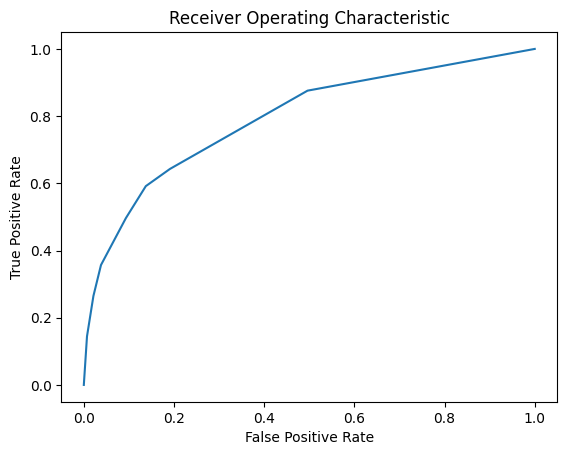

In [30]:
#Calculate the predicted probabilities of the positive class
y_pred_proba = dtc_tree.predict_proba(X_test)[:, 1]
    
#Compute the false positive rate,and thresholds 
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    
#compute the Area Under the curve(AUC)
auc = roc_auc_score(y_test, y_pred_proba)
    
#plot the ROC curve
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')

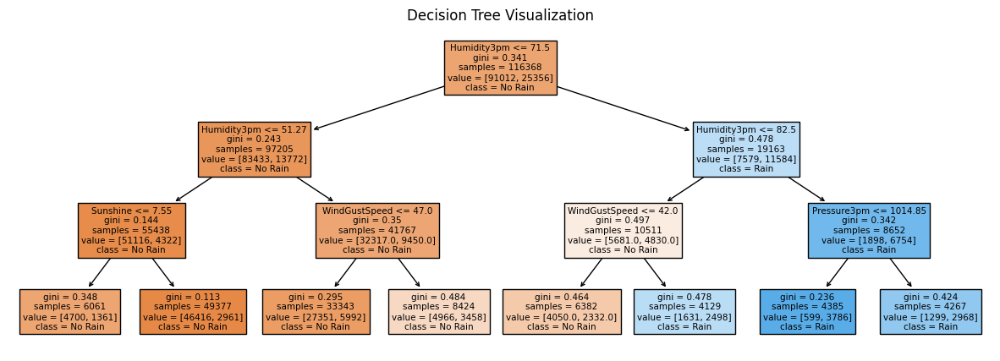

In [31]:
# Visualize Decision Tree
plt.figure(figsize=(15,5))
tree.plot_tree(dtc_tree, filled=True, feature_names=X_train.columns.tolist(), class_names=["No Rain", "Rain"])
plt.title("Decision Tree Visualization")
plt.show()

### **Model 02 - Random Forest Classifier**

In [32]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, roc_auc_score
from sklearn.metrics import roc_curve

In [33]:
# Create a Random Forest Classifier
rf_classifier = RandomForestClassifier(random_state=42)

In [34]:
# Define the parameter grid for GridSearchCV
param_grid_rf = {
    'n_estimators': [50, 200],
    'max_depth': [10, 20],
    'min_samples_split': [5, 10],
    'min_samples_leaf': [1, 4],
}

In [35]:
# Perform GridSearchCV
grid_search_rf = GridSearchCV(rf_classifier, param_grid_rf, cv=3, scoring='accuracy')
grid_search_rf.fit(X_train, y_train)

GridSearchCV(cv=3, estimator=RandomForestClassifier(random_state=42),
             param_grid={'max_depth': [10, 20], 'min_samples_leaf': [1, 4],
                         'min_samples_split': [5, 10],
                         'n_estimators': [50, 200]},
             scoring='accuracy')

In [36]:
# Get the best parameters and model
best_params_rf = grid_search_rf.best_params_
best_rf_classifier = grid_search_rf.best_estimator_

In [37]:
# Predict Values
y_train_pred = best_rf_classifier.predict(X_train)
y_test_pred = best_rf_classifier.predict(X_test)

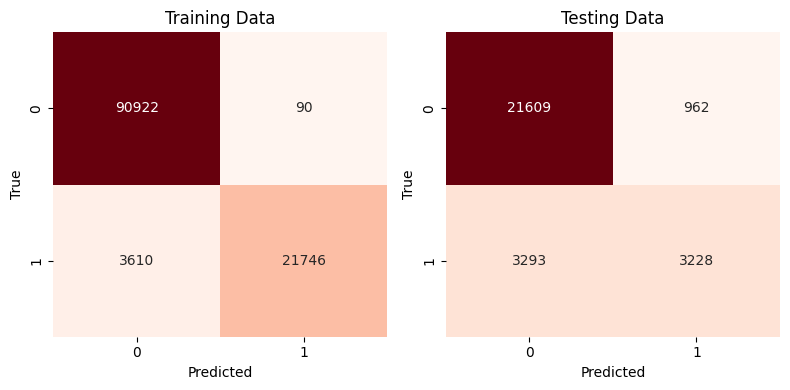

In [38]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4))

# Confusion Matrix for Training Data
cm_train = confusion_matrix(y_train, y_train_pred)
sns.heatmap(cm_train, ax=axes[0], annot=True, fmt='d', cmap='Reds', cbar=False)
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('True')
axes[0].set_title('Training Data')

# Confusion Matrix for Testing Data
cm_test = confusion_matrix(y_test, y_test_pred)
sns.heatmap(cm_test, ax=axes[1], annot=True, fmt='d', cmap='Reds', cbar=False)
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('True')
axes[1].set_title('Testing Data')

plt.tight_layout()
plt.show()


In [39]:
# Accuracy
RFC_accuracy_score=accuracy_score(y_test, y_test_pred)
print("Accuracy (Test) of Random Forest Classifier:",RFC_accuracy_score,"\n")

# Precision
RFC_precision_score=precision_score(y_test, y_test_pred)
print("Precision (Test) of Random Forest Classifier:", RFC_precision_score,"\n")

# Recall
RFC_recall_score=recall_score(y_test, y_test_pred)
print("Recall (Test) of Random Forest Classifier:",RFC_recall_score ,"\n")

# ROC AUC Score
RFC_roc_auc_score= roc_auc_score(y_test, y_test_pred)
print("ROC AUC Score (Test) of Random Forest Classifier:", RFC_roc_auc_score)

Accuracy (Test) of Random Forest Classifier: 0.8537398597552591 

Precision (Test) of Random Forest Classifier: 0.7704057279236277 

Recall (Test) of Random Forest Classifier: 0.4950161018248735 

ROC AUC Score (Test) of Random Forest Classifier: 0.7261975196998188


Text(0.5, 1.0, 'Receiver Operating Characteristic')

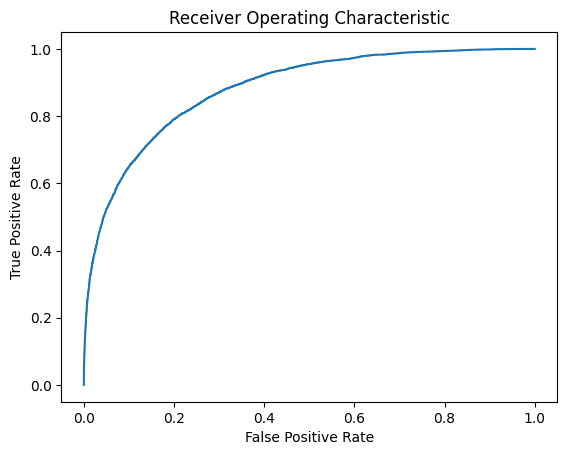

In [40]:
#Calculate the predicted probabilities of the positive class
y_pred_proba = best_rf_classifier.predict_proba(X_test)[:, 1]
    
#Compute the false positive rate,and thresholds 
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    
#compute the Area Under the curve(AUC)
auc = roc_auc_score(y_test, y_pred_proba)
    
#plot the ROC curve
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')

In [41]:
# Visualize the Decision Tree in the Random Forest Classifier
plt.figure(figsize=(100,100))
tree.plot_tree(best_rf_classifier.estimators_[0], feature_names=list(X_train.columns), class_names=["No Rain", "Rain"], filled=True)
plt.title("Decision Tree in Random Forest Classifier")
plt.show()

### **Model 03 - Logistic Regression Classifier**

In [42]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve

In [43]:
# Logistic regression Classifier
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

C:\Users\Rutik\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [44]:
# Predict Values
y_train_pred = logreg.predict(X_train)
y_test_pred = logreg.predict(X_test)

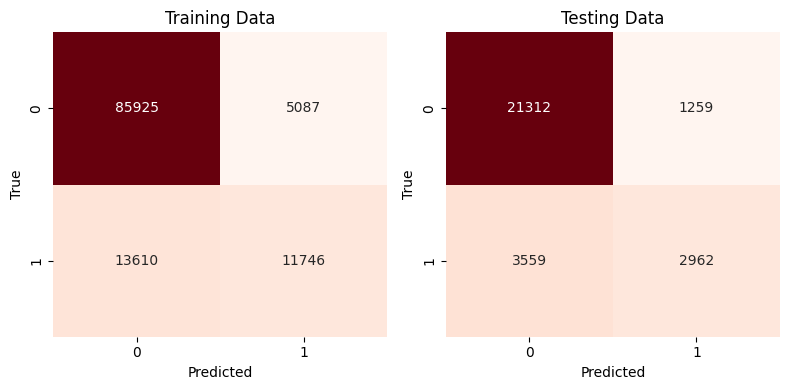

In [45]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4))

# Confusion Matrix for Training Data
cm_train = confusion_matrix(y_train, y_train_pred)
sns.heatmap(cm_train, ax=axes[0], annot=True, fmt='d', cmap='Reds', cbar=False)
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('True')
axes[0].set_title('Training Data')

# Confusion Matrix for Testing Data
cm_test = confusion_matrix(y_test, y_test_pred)
sns.heatmap(cm_test, ax=axes[1], annot=True, fmt='d', cmap='Reds', cbar=False)
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('True')
axes[1].set_title('Testing Data')

plt.tight_layout()
plt.show()


In [46]:
# Accuracy
Logreg_accuracy_score=accuracy_score(y_test, y_test_pred)
print("Accuracy (Test) of Logistic Regression Classifier:",Logreg_accuracy_score)

# Precision
Logreg_precision_score=precision_score(y_test, y_test_pred)
print("Precision (Test) of Logistic Regression Classifier:", Logreg_precision_score)

# Recall
Logreg_recall_score=recall_score(y_test, y_test_pred)
print("Recall (Test) of Logistic Regression Classifier:",Logreg_recall_score)

# ROC AUC Score
Logreg_roc_auc_score= roc_auc_score(y_test, y_test_pred)
print("ROC AUC Score (Test) of Logistic Regression Classifier:",Logreg_roc_auc_score)


Accuracy (Test) of Logistic Regression Classifier: 0.8343874604702324
Precision (Test) of Logistic Regression Classifier: 0.7017294479981047
Recall (Test) of Logistic Regression Classifier: 0.45422481214537647
ROC AUC Score (Test) of Logistic Regression Classifier: 0.6992226360137631


Text(0.5, 1.0, 'Receiver Operating Characteristic')

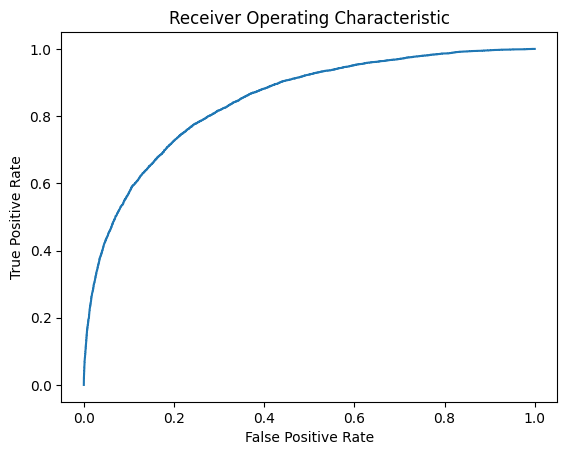

In [47]:
#Calculate the predicted probabilities of the positive class
y_pred_proba = logreg.predict_proba(X_test)[:, 1]
    
#Compute the false positive rate,and thresholds 
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    
#compute the Area Under the curve(AUC)
auc = roc_auc_score(y_test, y_pred_proba)
    
#plot the ROC curve
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')

### **Model 04 - Linear Discriminant Analysis**

In [48]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import roc_curve
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, roc_auc_score

In [49]:
# Decision Tree Classifier
lda = LinearDiscriminantAnalysis()
lda.fit(X_train, y_train)

LinearDiscriminantAnalysis()

In [50]:
# Predict Values
y_train_pred = lda.predict(X_train)
y_test_pred = lda.predict(X_test)

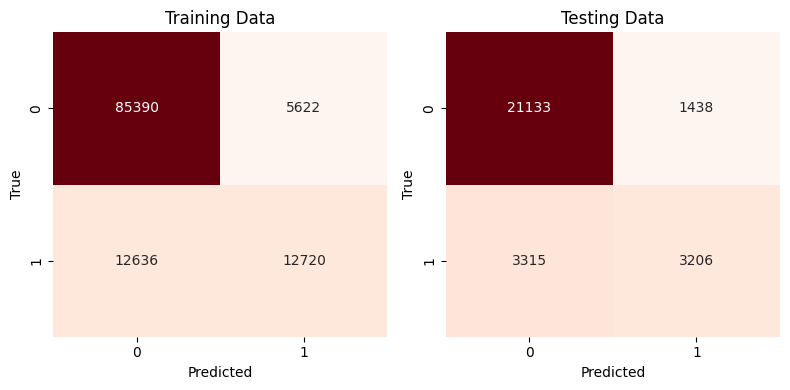

In [51]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4))

# Confusion Matrix for Training Data
cm_train = confusion_matrix(y_train, y_train_pred)
sns.heatmap(cm_train, ax=axes[0], annot=True, fmt='d', cmap='Reds', cbar=False)
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('True')
axes[0].set_title('Training Data')

# Confusion Matrix for Testing Data
cm_test = confusion_matrix(y_test, y_test_pred)
sns.heatmap(cm_test, ax=axes[1], annot=True, fmt='d', cmap='Reds', cbar=False)
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('True')
axes[1].set_title('Testing Data')

plt.tight_layout()
plt.show()


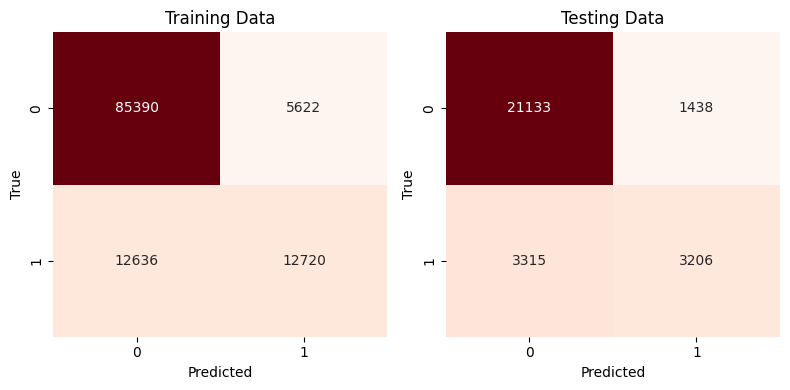

In [52]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4))

# Confusion Matrix for Training Data
cm_train = confusion_matrix(y_train, y_train_pred)
sns.heatmap(cm_train, ax=axes[0], annot=True, fmt='d', cmap='Reds', cbar=False)
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('True')
axes[0].set_title('Training Data')

# Confusion Matrix for Testing Data
cm_test = confusion_matrix(y_test, y_test_pred)
sns.heatmap(cm_test, ax=axes[1], annot=True, fmt='d', cmap='Reds', cbar=False)
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('True')
axes[1].set_title('Testing Data')

plt.tight_layout()
plt.show()


In [53]:
# Accuracy
LDA_accuracy_score=accuracy_score(y_test, y_test_pred)
print("Accuracy (Test) of Linear Discriminant Analysis:",LDA_accuracy_score)

# Precision
LDA_precision_score=precision_score(y_test, y_test_pred)
print("Precision (Test) of Linear Discriminant Analysis:", LDA_precision_score)

# Recall
LDA_recall_score=recall_score(y_test, y_test_pred)
print("Recall (Test) of Linear Discriminant Analysis:",LDA_recall_score)

# ROC AUC Score
LDA_roc_auc_score= roc_auc_score(y_test, y_test_pred)
print("ROC AUC Score (Test) of Linear Discriminant Analysis:", LDA_roc_auc_score)

Accuracy (Test) of Linear Discriminant Analysis: 0.8366217516843119
Precision (Test) of Linear Discriminant Analysis: 0.6903531438415159
Recall (Test) of Linear Discriminant Analysis: 0.49164238613709554
ROC AUC Score (Test) of Linear Discriminant Analysis: 0.7139661578463601


Text(0.5, 1.0, 'Receiver Operating Characteristic')

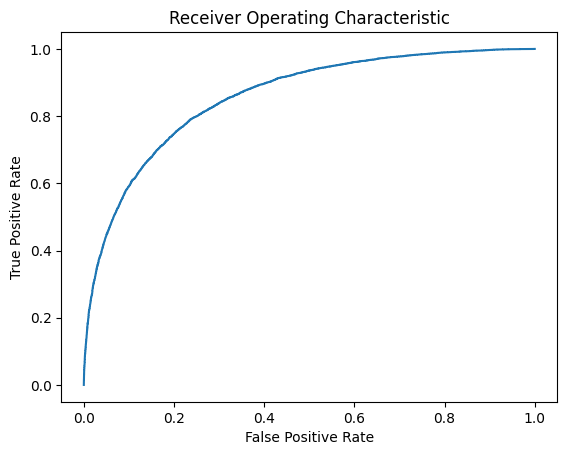

In [54]:
#Calculate the predicted probabilities of the positive class
y_pred_proba = lda.predict_proba(X_test)[:, 1]
    
#Compute the false positive rate,and thresholds 
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    
#compute the Area Under the curve(AUC)
auc = roc_auc_score(y_test, y_pred_proba)
    
#plot the ROC curve
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')

### **Model 05 - Catboost classifier**

In [55]:
from catboost import CatBoostClassifier

In [56]:
model_params = {
    'learning_rate': 0.3, 
    'iterations': 100,
    'depth': 7, 
    'loss_function': 'Logloss'  
}

In [57]:
catboost = CatBoostClassifier(**model_params)
catboost.fit(X_train, y_train)

0:	learn: 0.5209392	total: 176ms	remaining: 17.4s
1:	learn: 0.4334281	total: 193ms	remaining: 9.44s
2:	learn: 0.3985597	total: 209ms	remaining: 6.77s
3:	learn: 0.3811748	total: 225ms	remaining: 5.39s
4:	learn: 0.3704482	total: 240ms	remaining: 4.55s
5:	learn: 0.3640968	total: 256ms	remaining: 4s
6:	learn: 0.3596209	total: 272ms	remaining: 3.61s
7:	learn: 0.3564911	total: 288ms	remaining: 3.31s
8:	learn: 0.3543136	total: 303ms	remaining: 3.07s
9:	learn: 0.3517093	total: 320ms	remaining: 2.88s
10:	learn: 0.3499243	total: 337ms	remaining: 2.73s
11:	learn: 0.3487024	total: 354ms	remaining: 2.59s
12:	learn: 0.3474614	total: 371ms	remaining: 2.48s
13:	learn: 0.3462440	total: 387ms	remaining: 2.38s
14:	learn: 0.3453607	total: 405ms	remaining: 2.29s
15:	learn: 0.3445832	total: 420ms	remaining: 2.2s
16:	learn: 0.3435427	total: 436ms	remaining: 2.13s
17:	learn: 0.3426263	total: 453ms	remaining: 2.06s
18:	learn: 0.3412219	total: 469ms	remaining: 2s
19:	learn: 0.3400220	total: 487ms	remaining: 1.9

In [58]:
y_train_pred = catboost.predict(X_train)
y_test_pred = catboost.predict(X_test)

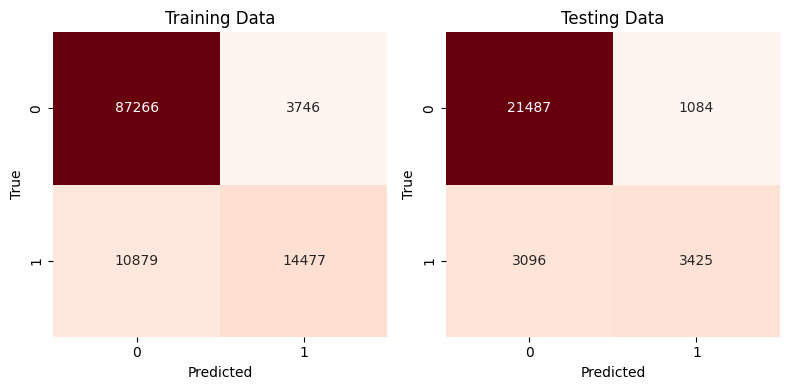

In [59]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4))

# Confusion Matrix for Training Data
cm_train = confusion_matrix(y_train, y_train_pred)
sns.heatmap(cm_train, ax=axes[0], annot=True, fmt='d', cmap='Reds', cbar=False)
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('True')
axes[0].set_title('Training Data')

# Confusion Matrix for Testing Data
cm_test = confusion_matrix(y_test, y_test_pred)
sns.heatmap(cm_test, ax=axes[1], annot=True, fmt='d', cmap='Reds', cbar=False)
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('True')
axes[1].set_title('Testing Data')

plt.tight_layout()
plt.show()


In [60]:
# Accuracy
catboost_accuracy_score=accuracy_score(y_test, y_test_pred)
print("Accuracy (Test) of Linear Discriminant Analysis:",catboost_accuracy_score)

# Precision
catboost_precision_score=precision_score(y_test, y_test_pred)
print("Precision (Test) of Linear Discriminant Analysis:", catboost_precision_score)

# Recall
catboost_recall_score=recall_score(y_test, y_test_pred)
print("Recall (Test) of Linear Discriminant Analysis:",catboost_recall_score )

# ROC AUC Score
catboost_roc_auc_score= roc_auc_score(y_test, y_test_pred)
print("ROC AUC Score (Test) of Linear Discriminant Analysis:", catboost_roc_auc_score)

Accuracy (Test) of Linear Discriminant Analysis: 0.8563178880791971
Precision (Test) of Linear Discriminant Analysis: 0.759591927256598
Recall (Test) of Linear Discriminant Analysis: 0.5252261923017942
ROC AUC Score (Test) of Linear Discriminant Analysis: 0.7385999819778432


Text(0.5, 1.0, 'Receiver Operating Characteristic')

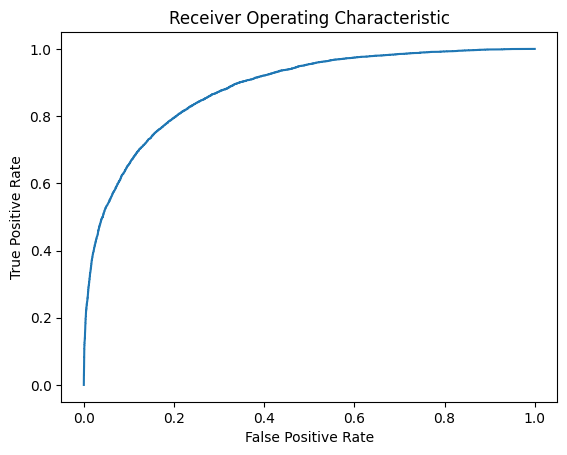

In [61]:
#Calculate the predicted probabilities of the positive class
y_pred_proba = catboost.predict_proba(X_test)[:, 1]
    
#Compute the false positive rate,and thresholds 
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    
#compute the Area Under the curve(AUC)
auc = roc_auc_score(y_test, y_pred_proba)
    
#plot the ROC curve
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')

### **Model 05 -Ada Boost Classifier**

In [62]:
from sklearn.ensemble import AdaBoostClassifier

In [63]:
# Creating adaboost classifier model 
adb = AdaBoostClassifier() 
adb_model = adb.fit(X_train,y_train)

C:\Users\Rutik\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\sklearn\ensemble\_weight_boosting.py:519: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


In [64]:
# Predict Values
y_train_pred = adb_model.predict(X_train)
y_test_pred = adb_model.predict(X_test)

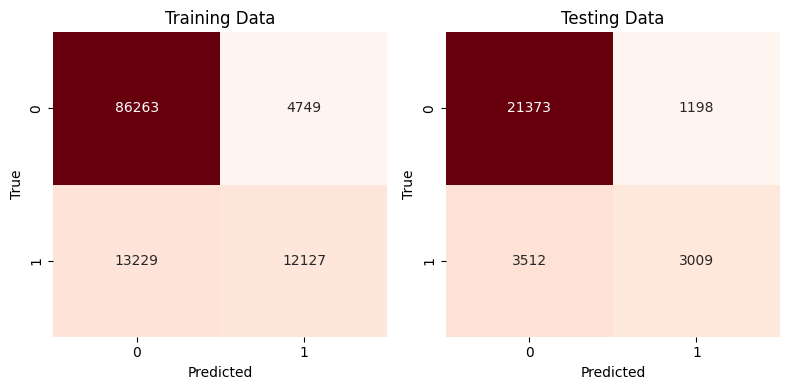

In [65]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4))

# Confusion Matrix for Training Data
cm_train = confusion_matrix(y_train, y_train_pred)
sns.heatmap(cm_train, ax=axes[0], annot=True, fmt='d', cmap='Reds', cbar=False)
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('True')
axes[0].set_title('Training Data')

# Confusion Matrix for Testing Data
cm_test = confusion_matrix(y_test, y_test_pred)
sns.heatmap(cm_test, ax=axes[1], annot=True, fmt='d', cmap='Reds', cbar=False)
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('True')
axes[1].set_title('Testing Data')

plt.tight_layout()
plt.show()

In [66]:
# Accuracy
Ada_Boost_accuracy_score=accuracy_score(y_test, y_test_pred)
print("Accuracy (Test) of Ada Boost Classifier:",Ada_Boost_accuracy_score)

# Precision
Ada_Boost_precision_score=precision_score(y_test, y_test_pred)
print("Precision (Test) of Ada Boost Classifier:", Ada_Boost_precision_score)

# Recall
Ada_Boost_recall_score=recall_score(y_test, y_test_pred)
print("Recall (Test) of Ada Boost Classifier:",Ada_Boost_recall_score)

# ROC AUC Score
Ada_Boost_roc_auc_score= roc_auc_score(y_test, y_test_pred)
print("ROC AUC Score (Test) of Ada Boost Classifier:", Ada_Boost_roc_auc_score)

Accuracy (Test) of Ada Boost Classifier: 0.8380998212567029
Precision (Test) of Ada Boost Classifier: 0.7152365105776087
Recall (Test) of Ada Boost Classifier: 0.4614322956601748
ROC AUC Score (Test) of Ada Boost Classifier: 0.7041776692513803


Text(0.5, 1.0, 'Receiver Operating Characteristic')

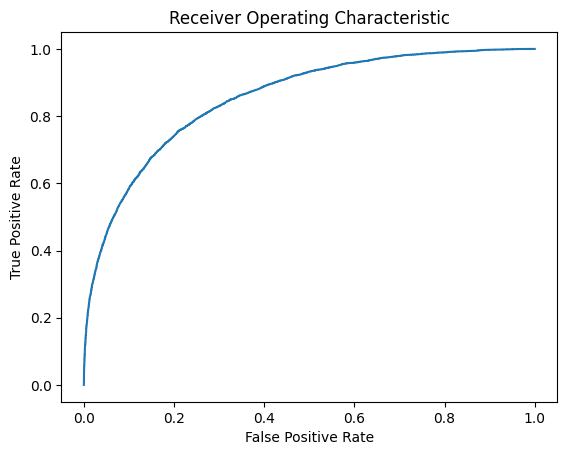

In [67]:
#Calculate the predicted probabilities of the positive class
y_pred_proba = adb_model.predict_proba(X_test)[:, 1]
    
#Compute the false positive rate,and thresholds 
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    
#compute the Area Under the curve(AUC)
auc = roc_auc_score(y_test, y_pred_proba)
    
#plot the ROC curve
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')

### **Model 07 -Bagging Classifier**

In [68]:
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

In [69]:
# Instantiate the base estimator
clftree = DecisionTreeClassifier(random_state=42)

# Instantiate the Bagging Classifier with the corrected parameter name
bag_clf = BaggingClassifier(estimator=clftree, n_estimators=1000, bootstrap=True, n_jobs=-1, random_state=42)

In [70]:
bag_clf.fit(X_train, y_train)

BaggingClassifier(estimator=DecisionTreeClassifier(random_state=42),
                  n_estimators=1000, n_jobs=-1, random_state=42)

In [71]:
# Predict Values
y_train_pred = bag_clf.predict(X_train)
y_test_pred = bag_clf.predict(X_test)

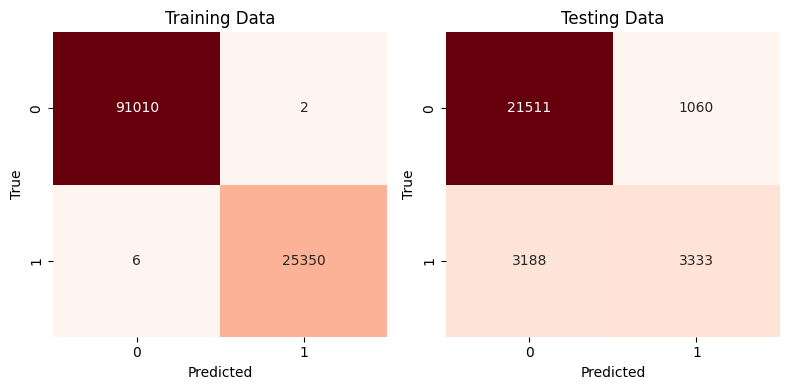

In [72]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4))

# Confusion Matrix for Training Data
cm_train = confusion_matrix(y_train, y_train_pred)
sns.heatmap(cm_train, ax=axes[0], annot=True, fmt='d', cmap='Reds', cbar=False)
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('True')
axes[0].set_title('Training Data')

# Confusion Matrix for Testing Data
cm_test = confusion_matrix(y_test, y_test_pred)
sns.heatmap(cm_test, ax=axes[1], annot=True, fmt='d', cmap='Reds', cbar=False)
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('True')
axes[1].set_title('Testing Data')

plt.tight_layout()
plt.show()

In [73]:
# Accuracy
Bagging_Boost_accuracy_score=accuracy_score(y_test, y_test_pred)
print("Accuracy (Test) of Bagging Classifier:",Bagging_Boost_accuracy_score,"\n")

# Precision
Bagging_Boost_precision_score=precision_score(y_test, y_test_pred)
print("Precision (Test) of Bagging Classifier:", Bagging_Boost_precision_score,"\n")

# Recall
Bagging_Boost_recall_score=recall_score(y_test, y_test_pred)
print("Recall (Test) of Bagging Classifier:",Bagging_Boost_recall_score ,"\n")

# ROC AUC Score
Bagging_Boost_roc_auc_score= roc_auc_score(y_test, y_test_pred)
print("ROC AUC Score (Test) of Bagging Classifier:", Bagging_Boost_roc_auc_score)

Accuracy (Test) of Bagging Classifier: 0.8539804757321601 

Precision (Test) of Bagging Classifier: 0.7587070339175962 

Recall (Test) of Bagging Classifier: 0.5111179266983591 

ROC AUC Score (Test) of Bagging Classifier: 0.7320775048404736


Text(0.5, 1.0, 'Receiver Operating Characteristic')

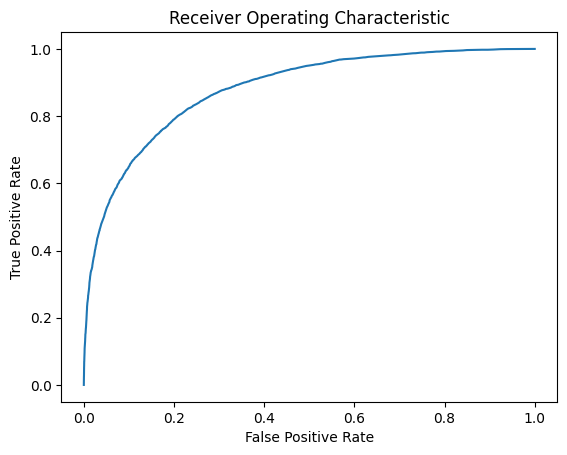

In [74]:
#Calculate the predicted probabilities of the positive class
y_pred_proba = bag_clf.predict_proba(X_test)[:, 1]
    
#Compute the false positive rate,and thresholds 
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    
#compute the Area Under the curve(AUC)
auc = roc_auc_score(y_test, y_pred_proba)
    
#plot the ROC curve
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')

### **Model 08 - K-Neighbors Classifier**

In [76]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_curve

In [77]:
# Create a KNN Classifier
knn_classifier = KNeighborsClassifier()

# Define the parameter grid for GridSearchCV
param_grid_knn = {
    'n_neighbors': [3, 5, 7]
}

In [78]:
# Perform GridSearchCV
grid_search_knn = GridSearchCV(knn_classifier, param_grid_knn, cv=3, scoring='accuracy')
grid_search_knn.fit(X_train, y_train)

# Get the best parameters and model
best_params_knn = grid_search_knn.best_params_
best_knn_classifier = grid_search_knn.best_estimator_

In [79]:
# Predict Values
y_train_pred = best_knn_classifier.predict(X_train)
y_test_pred = best_knn_classifier.predict(X_test)

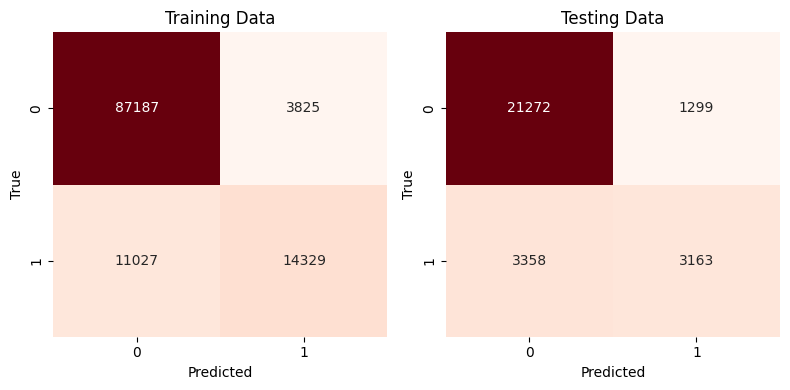

In [80]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4))

# Confusion Matrix for Training Data
cm_train = confusion_matrix(y_train, y_train_pred)
sns.heatmap(cm_train, ax=axes[0], annot=True, fmt='d', cmap='Reds', cbar=False)
axes[0].set_xlabel('Predicted')
axes[0].set_ylabel('True')
axes[0].set_title('Training Data')

# Confusion Matrix for Testing Data
cm_test = confusion_matrix(y_test, y_test_pred)
sns.heatmap(cm_test, ax=axes[1], annot=True, fmt='d', cmap='Reds', cbar=False)
axes[1].set_xlabel('Predicted')
axes[1].set_ylabel('True')
axes[1].set_title('Testing Data')

plt.tight_layout()
plt.show()

In [81]:
# Accuracy
KNN_accuracy_score=accuracy_score(y_test, y_test_pred)
print("Accuracy (Test) of K-Neighbors Classifier:",KNN_accuracy_score,"\n")

# Precision
KNN_precision_score=precision_score(y_test, y_test_pred)
print("Precision (Test) of K-Neighbors Classifier:", KNN_precision_score,"\n")

# Recall
KNN_recall_score=recall_score(y_test, y_test_pred)
print("Recall (Test) of K-Neighbors Classifier:",KNN_recall_score ,"\n")

# ROC AUC Score
KNN_roc_auc_score= roc_auc_score(y_test, y_test_pred)
print("ROC AUC Score (Test) of K-Neighbors Classifier:", KNN_roc_auc_score)

Accuracy (Test) of K-Neighbors Classifier: 0.8399216279389523 

Precision (Test) of K-Neighbors Classifier: 0.7088749439713133 

Recall (Test) of K-Neighbors Classifier: 0.48504830547462047 

ROC AUC Score (Test) of K-Neighbors Classifier: 0.7137482899044716


Text(0.5, 1.0, 'Receiver Operating Characteristic')

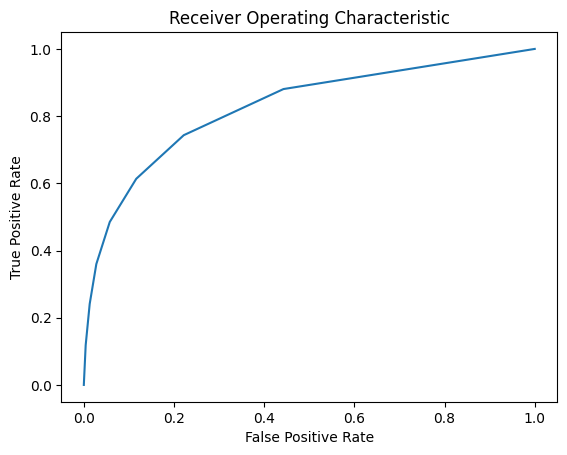

In [82]:
#Calculate the predicted probabilities of the positive class
y_pred_proba = best_knn_classifier.predict_proba(X_test)[:, 1]
    
#Compute the false positive rate,and thresholds 
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba)
    
#compute the Area Under the curve(AUC)
auc = roc_auc_score(y_test, y_pred_proba)
    
#plot the ROC curve
plt.plot(fpr,tpr)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')

### **Evaluation Accuracy for all classifiers**


In [88]:
# Display Accuracy for all classifiers
print("Accuracy (Test) of Classifiers\n")
print("Decision Tree Classifier:", DTC_accuracy_score)
print("Random Forest Classifier:", RFC_accuracy_score)
print("Logistic Regression Classifier:", Logreg_accuracy_score)
print("Linear Discriminant Analysis:", LDA_accuracy_score)
print("Ada Boost Classifier:", Ada_Boost_accuracy_score)
print("Bagging Classifier:",Bagging_Boost_accuracy_score)
print("Cat-Boost Classifier:", catboost_accuracy_score)
print("K-Neighbors Classifier:",KNN_accuracy_score)

# Display Precision for all classifiers
print("\nPrecision (Test) of Classifiers\n")
print("Decision Tree Classifier:", DTC_precision_score)
print("Random Forest Classifier:", RFC_precision_score)
print("Logistic Regression Classifier:", Logreg_precision_score)
print("Linear Discriminant Analysis:", LDA_precision_score)
print("Ada Boost Classifier:", Ada_Boost_precision_score)
print("Bagging Classifier:", Bagging_Boost_precision_score)
print("Cat-Boost Classifier:", catboost_precision_score)
print("K-Neighbors Classifier:", KNN_precision_score)


# Display Recall for all classifiers
print("\nRecall (Test) of Classifiers\n")
print("Decision Tree Classifier:", DTC_recall_score)
print("Random Forest Classifier:", RFC_recall_score)
print("Logistic Regression Classifier:", Logreg_recall_score)
print("Linear Discriminant Analysis:", LDA_recall_score)
print("Ada Boost Classifier:", Ada_Boost_recall_score)
print("Bagging Classifier:",Bagging_Boost_recall_score)
print("Cat-Boost Classifier:", catboost_recall_score)
print("K-Neighbors Classifier:",KNN_recall_score)

# Display ROC AUC Score for all classifiers
print("\nROC AUC Score (Test) of Classifiers\n")
print("Decision Tree Classifier:", DTC_roc_auc_score)
print("Random Forest Classifier:", RFC_roc_auc_score)
print("Logistic Regression Classifier:", Logreg_roc_auc_score)
print("Linear Discriminant Analysis:", LDA_roc_auc_score)
print("Ada Boost Classifier:", Ada_Boost_roc_auc_score)
print("Bagging Classifier:", Bagging_Boost_roc_auc_score)
print("Cat-Boost Classifier:", catboost_roc_auc_score)
print("K-Neighbors Classifier:", KNN_roc_auc_score)


Accuracy (Test) of Classifiers

Decision Tree Classifier: 0.8263096383885604
Random Forest Classifier: 0.8537398597552591
Logistic Regression Classifier: 0.8343874604702324
Linear Discriminant Analysis: 0.8366217516843119
Ada Boost Classifier: 0.8380998212567029
Bagging Classifier: 0.8539804757321601
Cat-Boost Classifier: 0.8563178880791971
K-Neighbors Classifier: 0.8399216279389523

Precision (Test) of Classifiers

Decision Tree Classifier: 0.7303829252981795
Random Forest Classifier: 0.7704057279236277
Logistic Regression Classifier: 0.7017294479981047
Linear Discriminant Analysis: 0.6903531438415159
Ada Boost Classifier: 0.7152365105776087
Bagging Classifier: 0.7587070339175962
Cat-Boost Classifier: 0.759591927256598
K-Neighbors Classifier: 0.7088749439713133

Recall (Test) of Classifiers

Decision Tree Classifier: 0.35684710933905844
Random Forest Classifier: 0.4950161018248735
Logistic Regression Classifier: 0.45422481214537647
Linear Discriminant Analysis: 0.49164238613709554
Ada

### **Overall Classifier Performance Ranking Table**

| Rank | Classifier                     | Accuracy | Precision | Recall | ROC AUC Score |
|------|--------------------------------|----------|-----------|--------|---------------|
| 1    | Cat-Boost Classifier           | 0.8563   | 0.7596    | 0.5252 | 0.7386        |
| 2    | Bagging Classifier             | 0.8540   | 0.7587    | 0.5111 | 0.7321        |
| 3    | Random Forest Classifier       | 0.8537   | 0.7704    | 0.4950 | 0.7262        |
| 4    | K-Neighbors Classifier         | 0.8399   | 0.7089    | 0.4850 | 0.7137        |
| 5    | Ada Boost Classifier           | 0.8381   | 0.7152    | 0.4614 | 0.7042        |
| 6    | Linear Discriminant Analysis   | 0.8366   | 0.6904    | 0.4916 | 0.7140        |
| 7    | Logistic Regression Classifier | 0.8344   | 0.7017    | 0.4542 | 0.6992        |
| 8    | Decision Tree Classifier       | 0.8263   | 0.7304    | 0.3568 | 0.6594        |


### **Model Selection**

In [90]:
import joblib
joblib.dump(catboost, "Ml-Model/best_model.pkl")

['Ml-Model/best_model.pkl']